In [4]:
import matplotlib.pyplot as plt
import time
import cv2
import numpy as np
import os

## Let's check different ways to detect chessboard: 
1. Canny edge to detect rectangle and take the biggest one, assuming that chessboard is the biggest object on the screen
2. Canny edge + hough line to detect lines on the image, after that find intersections of horizontal and vertical lines. Show those points
3. Show how the image looks in gray and using adaptive threshold find the edges of the chessboard
4. Use already implemented in cv2 library fast corner detector algorithm

In [5]:
def canny_rectangle_detect(filename):
    start_time = time.time()

    screenshot = cv2.imread(filename)
    screenshot_gray = cv2.cvtColor(screenshot, cv2.COLOR_BGR2GRAY)
    screenshot_rgb = cv2.cvtColor(screenshot, cv2.COLOR_BGR2RGB)
    
    sigma=0.33
    v = np.mean(screenshot_gray)
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    
    edges = cv2.Canny(screenshot_gray, lower, upper)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)[:5]
    
    cv2.drawContours(screenshot_rgb, contours, -1, (255, 0, 0), 2) 

    (x, y, w, h) = cv2.boundingRect(contours[0])   
    
    for cnt in contours:
        epsilon = 0.01 * cv2.arcLength(cnt, True)
        approx = cv2.approxPolyDP(cnt, epsilon, True)
        if len(approx) == 4:
            (x, y, w, h) = cv2.boundingRect(cnt)   
            break

    chess_board = screenshot[y:y+h, x:x+w]
    chess_board = cv2.resize(chess_board, (1024, 1024))
    
    print(f"Time elapsed {time.time() - start_time}")

    fig, axs = plt.subplots(1, 2, figsize=(25, 7), gridspec_kw={'width_ratios': [2, 1]})
    fig.suptitle('Canny rectangle', va='top')
    axs[0].imshow(screenshot_rgb)
    axs[0].axis("off")
    axs[1].imshow(cv2.cvtColor(chess_board, cv2.COLOR_BGR2RGB))
    axs[1].axis("off")
    plt.show()
        

In [6]:
def hough_lines_detect(filename):
    start_time = time.time()

    screenshot = cv2.imread(filename)
    screenshot_gray = cv2.cvtColor(screenshot, cv2.COLOR_BGR2GRAY)
    screenshot_rgb = cv2.cvtColor(screenshot, cv2.COLOR_BGR2RGB)
    
    edges = cv2.Canny(screenshot_gray, 200, 500)
    
    min_line_length=100
    max_line_gap=50
    lines = cv2.HoughLines(edges, 1, np.pi / 180, 125, min_line_length, max_line_gap)
    lines = np.reshape(lines, (-1, 2))

    h_lines, v_lines = [], []
    for rho, theta in lines:
        if theta < np.pi / 4 or theta > np.pi - np.pi / 4:
            v_lines.append([rho, theta])
        else:
            h_lines.append([rho, theta])

    points = []
    for r_h, t_h in h_lines:
        for r_v, t_v in v_lines:
            a = np.array([[np.cos(t_h), np.sin(t_h)], [np.cos(t_v), np.sin(t_v)]])
            b = np.array([r_h, r_v])
            inter_point = np.linalg.solve(a, b)
            points.append(inter_point)

    for point in points:
        x, y = int(point[0]), int(point[1])
        cv2.circle(screenshot_rgb, (x, y), radius=5, color=(255, 0, 0), thickness=-1)
    
    print(f"Time elapsed {time.time() - start_time}")
    
    plt.figure(figsize=(25, 20))
    plt.title("Hough transform")
    plt.imshow(screenshot_rgb)
    plt.axis("off")
    plt.show()
    

In [7]:
def adaptive_threshold_detect(filename):
    start_time = time.time()

    screenshot = cv2.imread(filename)
    screenshot_gray = cv2.cvtColor(screenshot, cv2.COLOR_BGR2GRAY)
    screenshot_rgb = cv2.cvtColor(screenshot, cv2.COLOR_BGR2RGB)
    
    close = np.max(screenshot_gray)
    div = np.float32(screenshot_gray)/(close)
    res = np.uint8(cv2.normalize(div,div,0,255,cv2.NORM_MINMAX))
    res2 = cv2.cvtColor(res,cv2.COLOR_GRAY2BGR)
    
    thresh = cv2.adaptiveThreshold(res,255,0,1,19,2)
    contours, hier = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

    cv2.drawContours(screenshot_rgb, contours, -1, (255, 0, 0), 2) 
 
    print(f"Time elapsed {time.time() - start_time}")
    
    fig, axs = plt.subplots(1, 2, figsize=(15, 5),)
    fig.suptitle('Adaptive threshold', va='bottom')
    axs[0].imshow(screenshot_rgb)
    axs[0].axis("off")
    axs[1].imshow(cv2.cvtColor(res2, cv2.COLOR_BGR2RGB))
    axs[1].axis("off")
    plt.show()


In [8]:
def fast_corner_detect(filename):
    start_time = time.time()

    screenshot = cv2.imread(filename)
    screenshot_gray = cv2.cvtColor(screenshot, cv2.COLOR_BGR2GRAY)
    screenshot_rgb = cv2.cvtColor(screenshot, cv2.COLOR_BGR2RGB)
    
    edges = cv2.Canny(screenshot_gray, 200, 500)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
    edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)
    
    fast = cv2.FastFeatureDetector_create()
    keypoints = fast.detect(edges, None)

    screenshot_rgb = cv2.drawKeypoints(screenshot_rgb, keypoints, None, color=(255, 0, 0))
    
    corners = cv2.goodFeaturesToTrack(edges, 50, 0.01, 10)
    corners = np.int64(corners)
    
    for corner in corners:
        x, y = corner.ravel()
        cv2.circle(screenshot_rgb, (x, y), 3, 255, -1)
 
    print(f"Time elapsed {time.time() - start_time}")
    
    plt.figure(figsize=(25, 20))
    plt.title("Fast (Features from Accelerated Segment Test) corner detector")
    plt.imshow(screenshot_rgb)
    plt.axis("off")
    plt.show()


chessarena.png
Time elapsed 0.11287617683410645


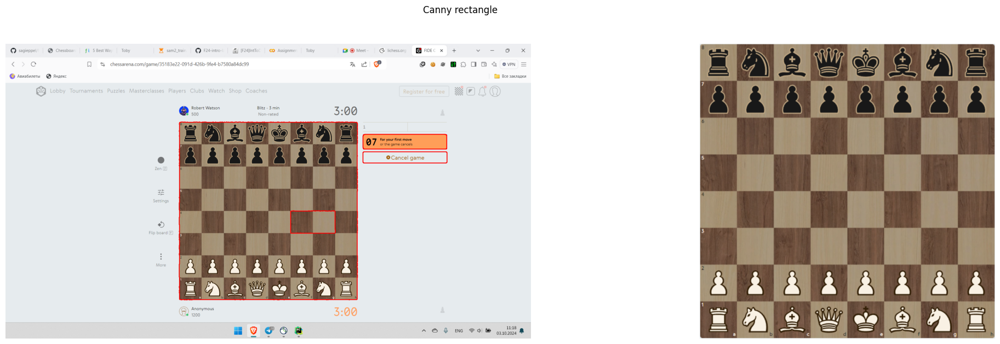

Time elapsed 2.2628695964813232


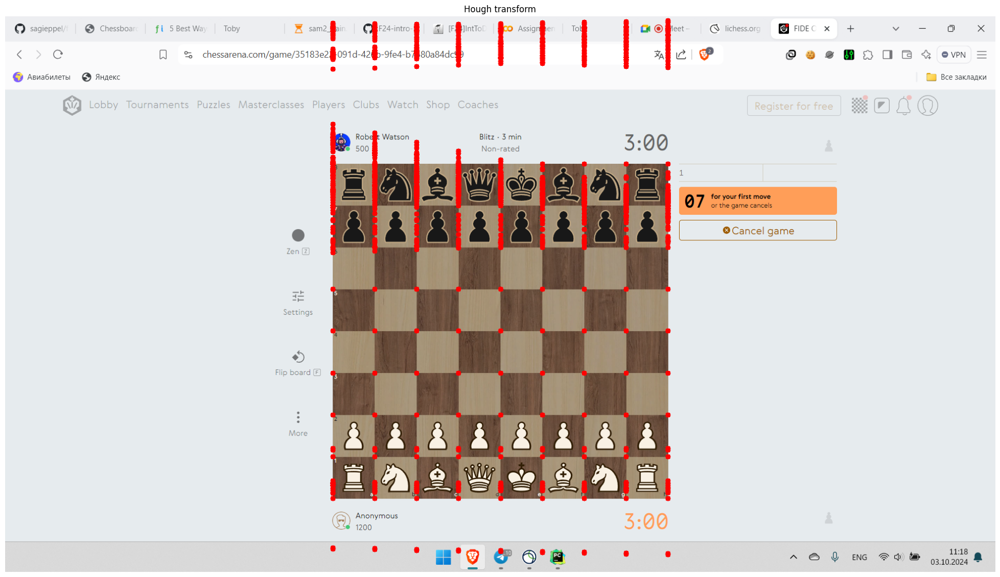

Time elapsed 0.1301720142364502


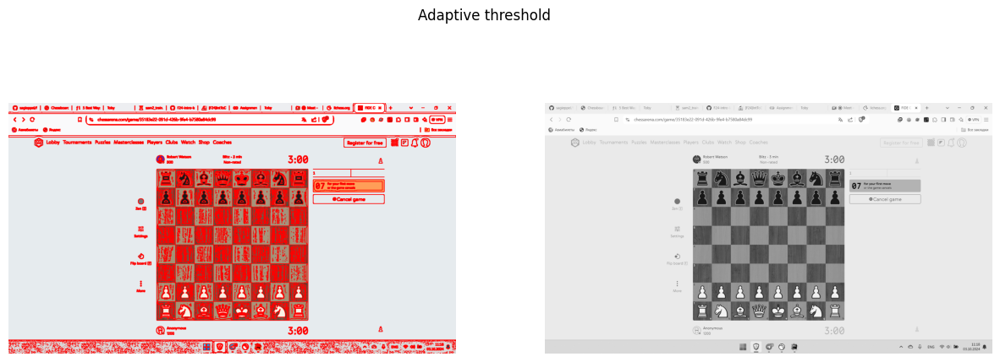

Time elapsed 0.14256858825683594


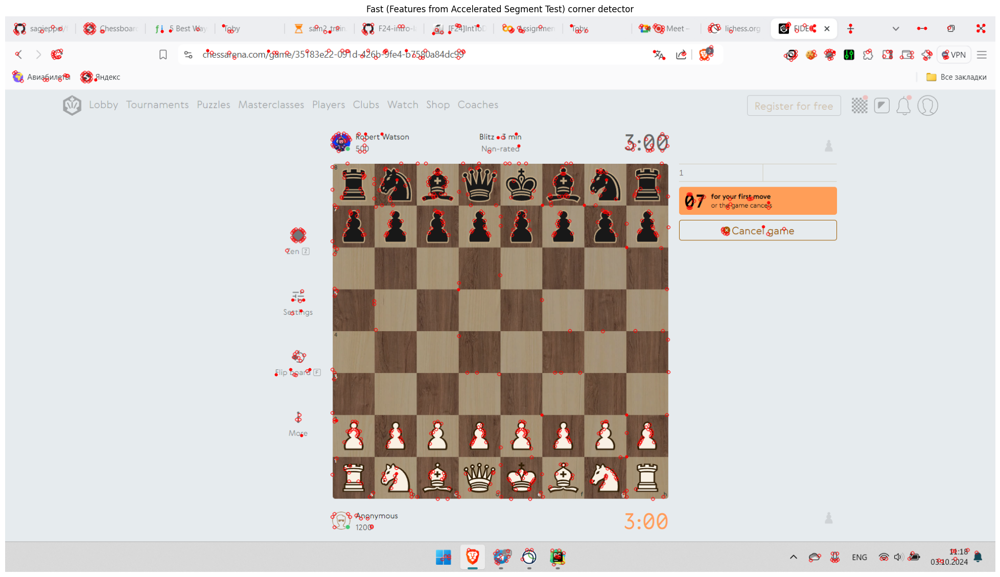

chessclub.png
Time elapsed 0.04520559310913086


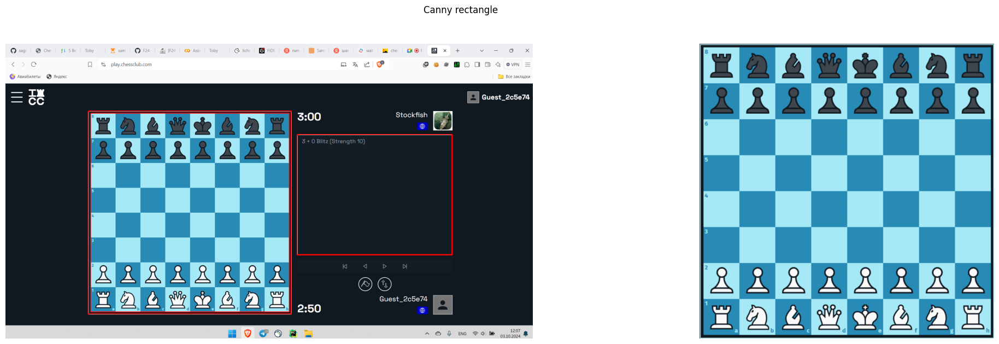

Time elapsed 2.5533480644226074


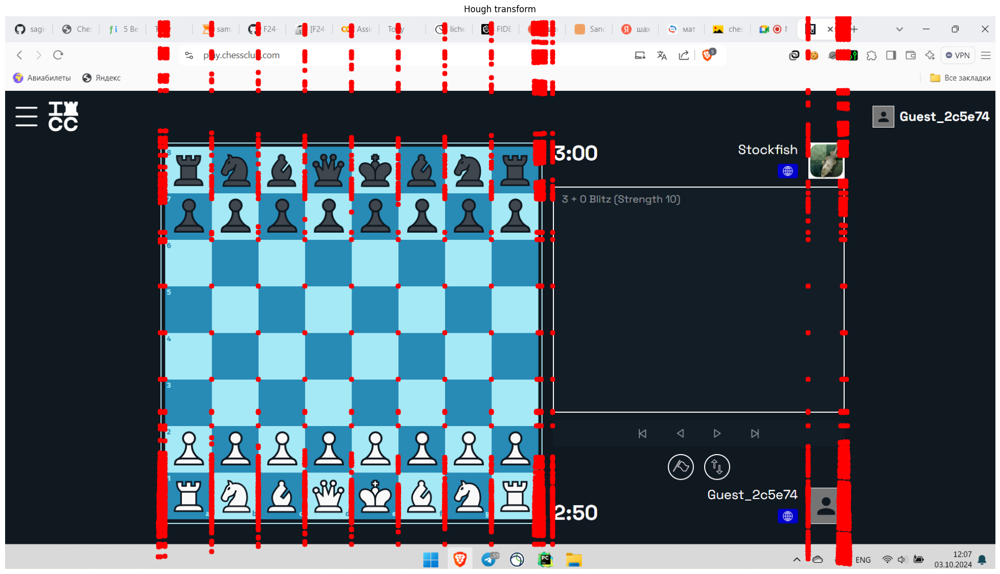

Time elapsed 0.08456635475158691


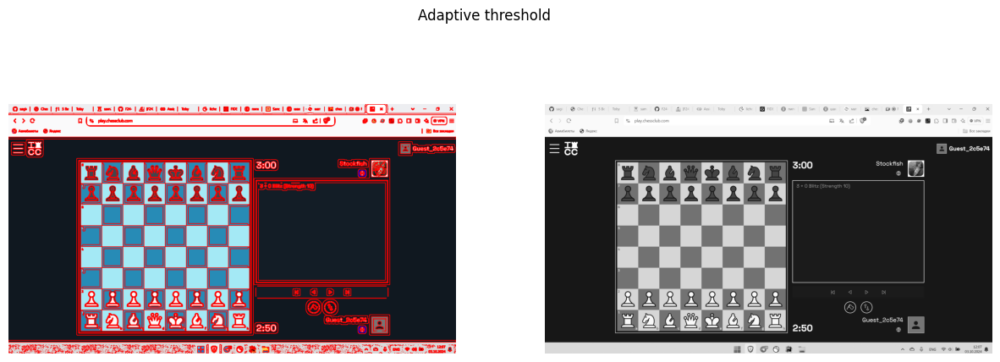

Time elapsed 0.11151456832885742


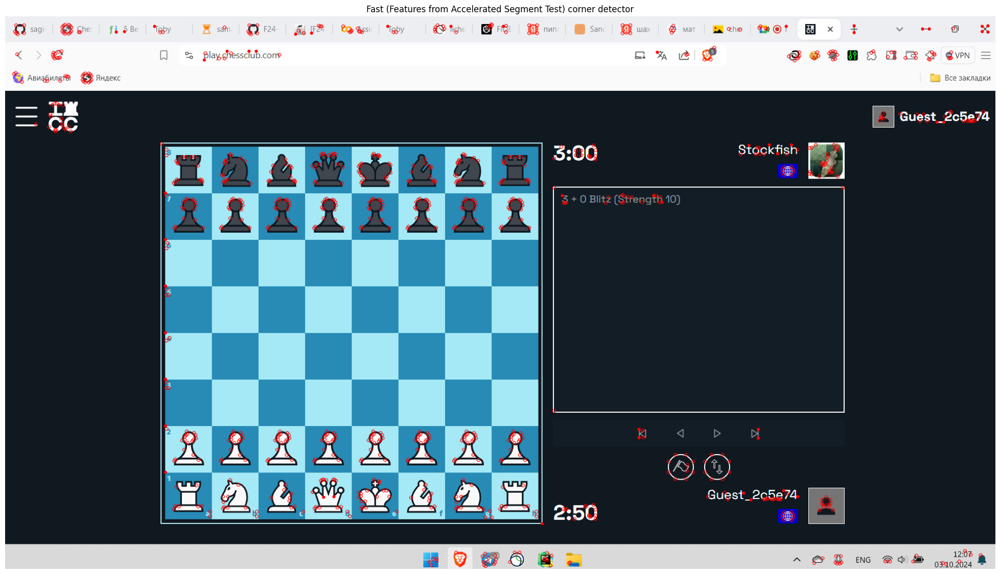

chesscom.png
Time elapsed 0.06910276412963867


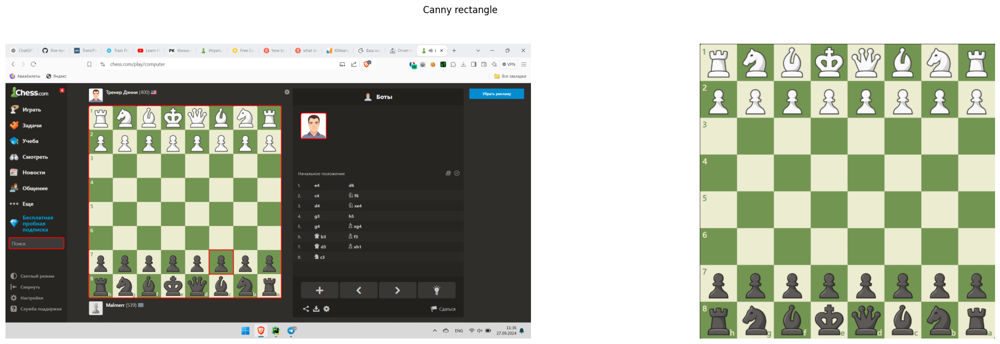

Time elapsed 2.1222217082977295


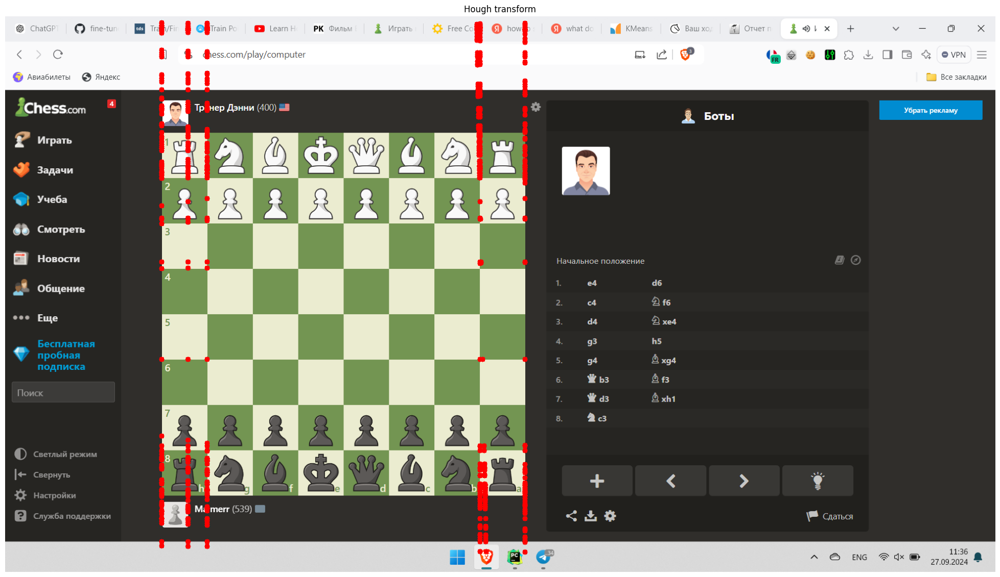

Time elapsed 0.15701055526733398


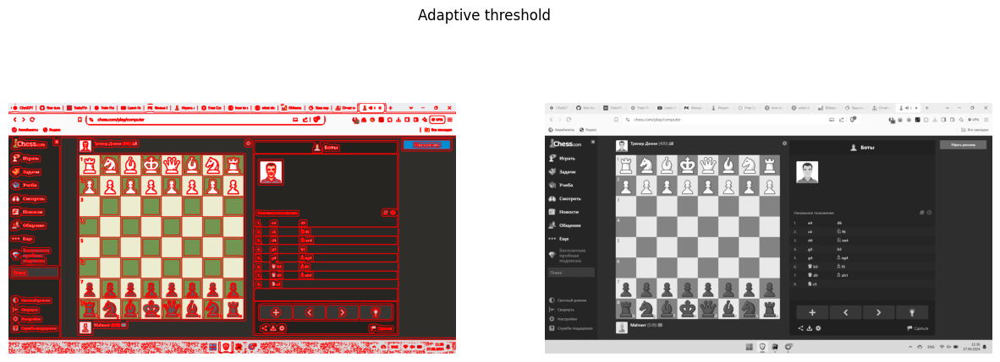

Time elapsed 0.10941910743713379


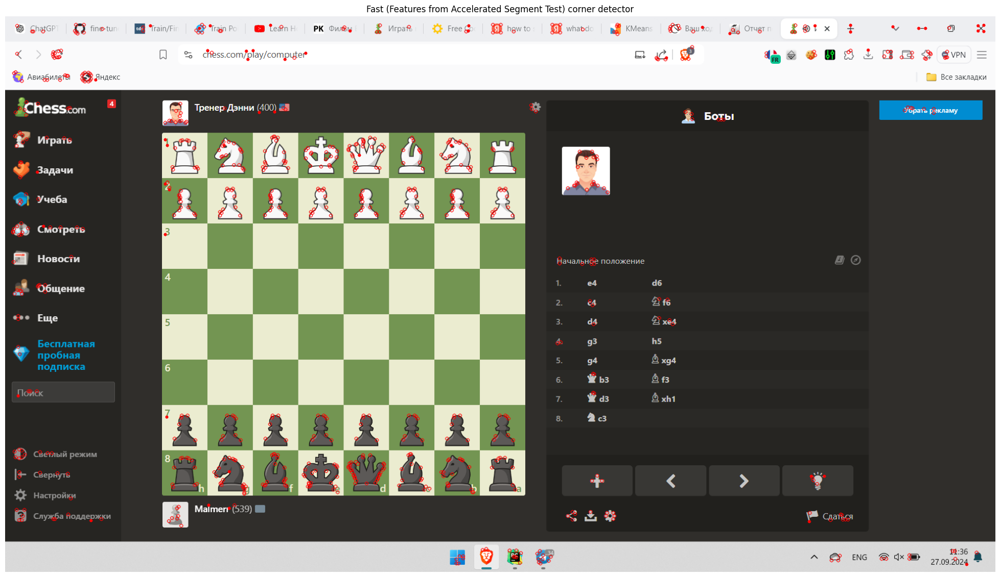

lichess.png
Time elapsed 0.06785106658935547


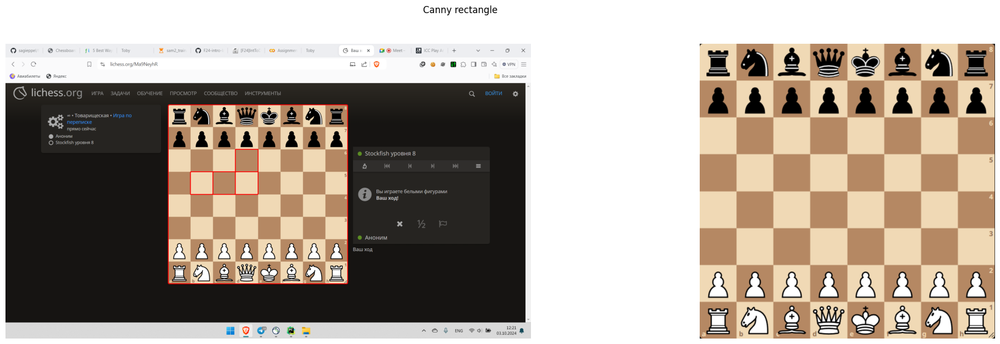

Time elapsed 2.566110134124756


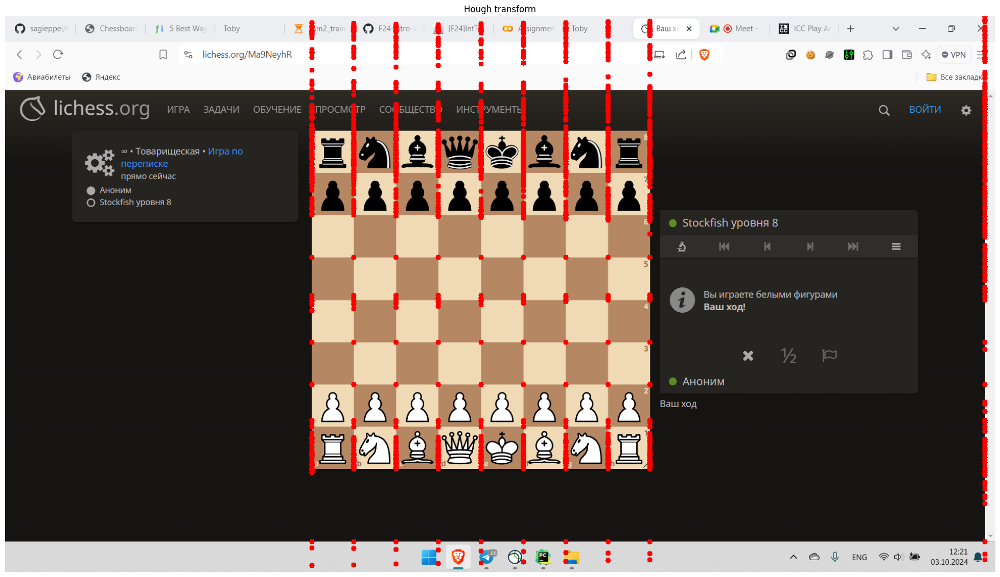

Time elapsed 0.08603620529174805


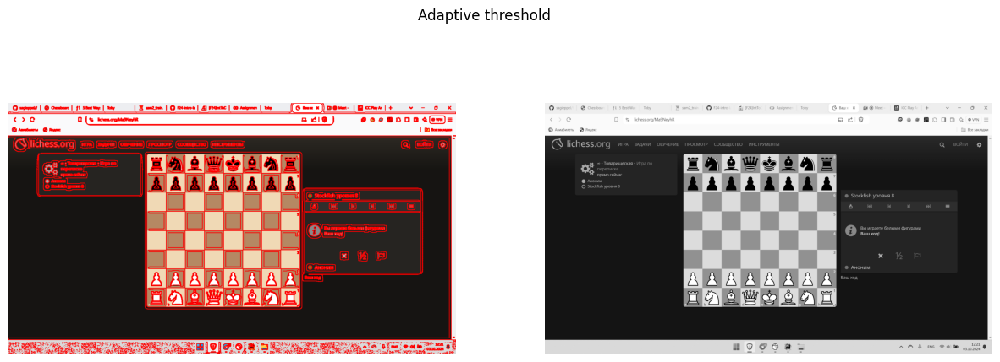

Time elapsed 0.09502506256103516


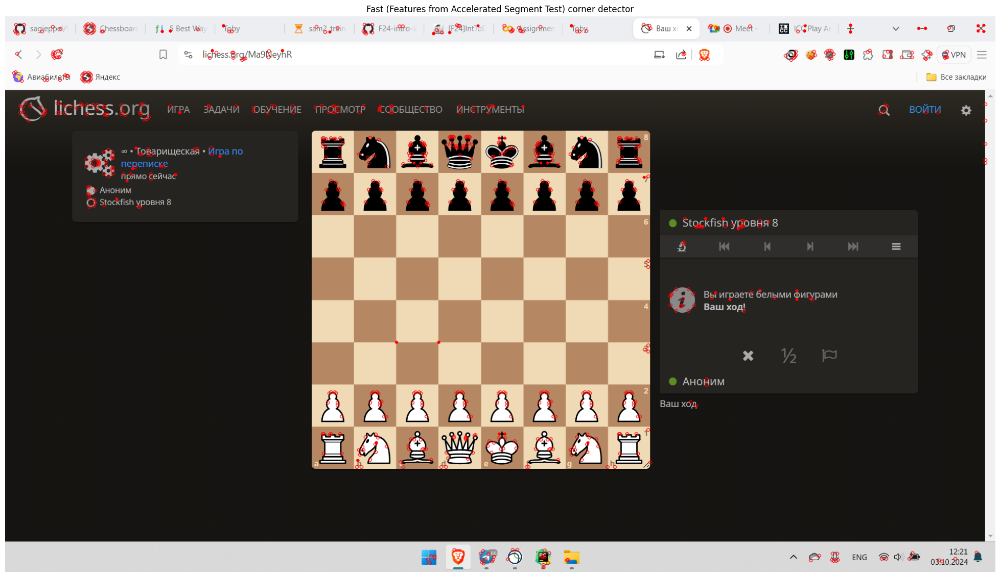

In [9]:
for dir in os.walk("../dataset/sites"):
    for file in dir[2]:
        file_path = os.path.join(dir[0], file)
        print(file)
        canny_rectangle_detect(filename=file_path)
        hough_lines_detect(filename=file_path)
        adaptive_threshold_detect(filename=file_path)
        fast_corner_detect(filename=file_path)


## As we can see all the methods have their pros and cons.
1. Canny edge detector and finding the rectangles is best and fastest among all algorithms. However, it includes lines and another rectangles around chessboard. Additionally, it is sensible for rectangles bigger than chessboard
2. Hough transform is very slow 2 sec for image, and it finds a lot of lines. This leads to a big number of points, while we are searching only corners.
3. It's hard to detect using gray or any other colors schemes, because screen has many different colors.
4. Fast detects many not necessary corners and additionally many chessboard has rounded corners, which is hard to detect.

### Therefore, I decided to choose Canny edge detector removing lines around chessboard  

In [31]:
def are_pixels_similar(pixel1, pixel2, threshold=10):
    distance = np.linalg.norm(pixel1 - pixel2)
    return distance < threshold

def remove_lines(chess_board):
    while not are_pixels_similar(chess_board[10][0], chess_board[10][1]):  # left 
        chess_board = chess_board[:, 1:]
    while not are_pixels_similar(chess_board[0][10], chess_board[1][10]):  # top
        chess_board = chess_board[1:, :]
    while not are_pixels_similar(chess_board[-11][-1], chess_board[-11][-2]):  # right
        chess_board = chess_board[:, :-1]
    while not are_pixels_similar(chess_board[-1][-11], chess_board[-2][-11]):  # bottom
        chess_board = chess_board[:-1, :]
    return chess_board

def is_cell_empty(cell_image, threshold):
    gray_cell = cv2.cvtColor(cell_image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray_cell, threshold, 255, cv2.ADAPTIVE_THRESH_MEAN_C)
    black_pixels = np.sum(thresh == 0)
    return black_pixels < 100


In [36]:
def detect_split(filename, player_side):
    start_time = time.time()

    screenshot = cv2.imread(filename)
    screenshot_gray = cv2.cvtColor(screenshot, cv2.COLOR_BGR2GRAY)
    
    sigma=0.33
    v = np.mean(screenshot_gray)
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    
    edges = cv2.Canny(screenshot_gray, lower, upper)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)[:5]
    
    (x, y, w, h) = cv2.boundingRect(contours[0])   
    best_area = cv2.contourArea(contours[0])    
    for i, cnt in enumerate(contours):
        epsilon = 0.01 * cv2.arcLength(cnt, True)
        approx = cv2.approxPolyDP(cnt, epsilon, True)
        if len(approx) == 4:
            area = cv2.contourArea(cnt)
            area_diff = abs(area - best_area) / best_area
            if area_diff > 0.05:
                break
            (x, y, w, h) = cv2.boundingRect(cnt)

    
    chess_board = screenshot[y:y+h, x:x+w]
    chess_board = remove_lines(chess_board)
    chess_board = cv2.resize(chess_board, (1024, 1024))

    columns = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h']
    rows = ['1', '2', '3', '4', '5', '6', '7', '8']
    step = (chess_board.shape[0]//8)
    
    # check for chessarena.com chessboard since it has wood texture. setting another threshold for emptiness of cell 
    chess_board_gray = cv2.cvtColor(chess_board, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(chess_board_gray, 160, 255, cv2.ADAPTIVE_THRESH_MEAN_C)
    black_threshold = 40 if np.sum(thresh == 0) > 700_000 else 100

    cells = []
    for row in range(len(rows)):
        for col in range(len(columns)):
            cell_image = chess_board[row*step:(row+1)*step, col*step:(col+1)*step]
            cell_is_empty = is_cell_empty(cell_image, black_threshold)     

            if player_side == "white":
                cell_label = f"{columns[col]}{rows[7-row]}"
            else:
                cell_label = f"{columns[7-col]}{rows[row]}" 

            cell = {"image": cell_image, "label": cell_label, "is_empty": cell_is_empty}
            cells.append(cell)
            
    print(f"Time elapsed {time.time() - start_time}")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(chess_board, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()
    
    rows, cols = 8, 8
    fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
    
    for i, cell in enumerate(cells):
        row, col = divmod(i, cols)
        axes[row, col].imshow(cv2.cvtColor(cell['image'], cv2.COLOR_BGR2RGB))
        axes[row, col].set_title(f"{cell['label']} {'Empty' if cell['is_empty'] else 'Piece'}")
        axes[row, col].axis("off")
    
    plt.tight_layout()
    plt.show()
    
        

chessarena.png
Time elapsed 0.07005906105041504


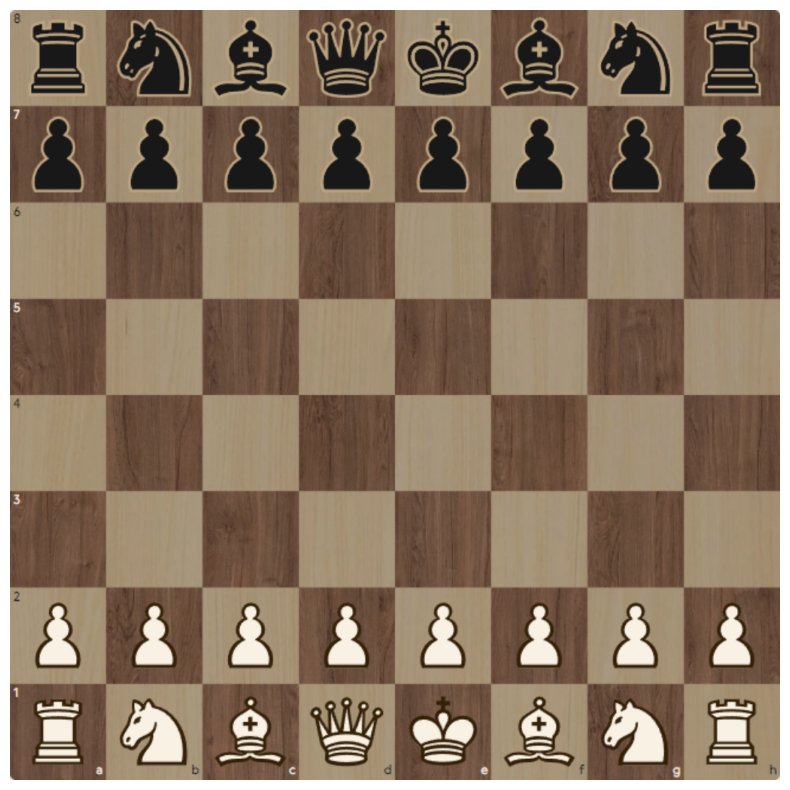

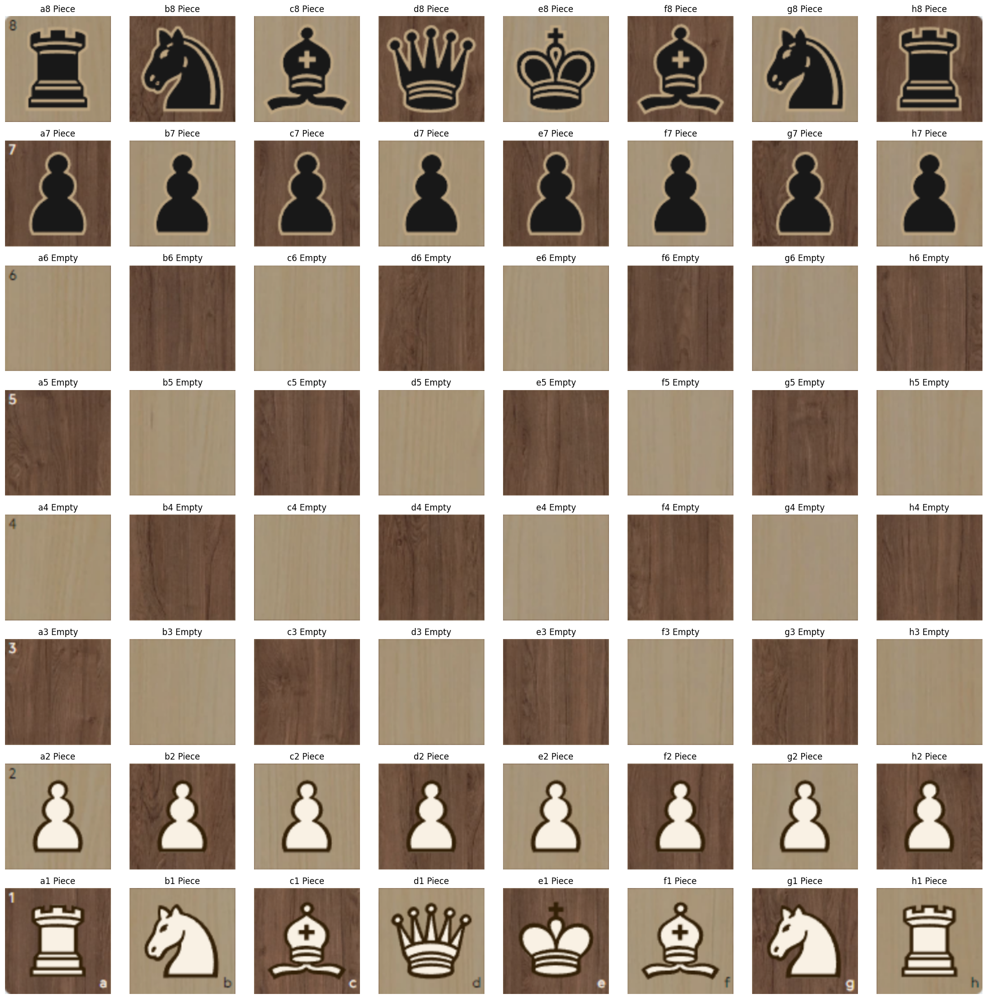

chessclub.png
Time elapsed 0.03611040115356445


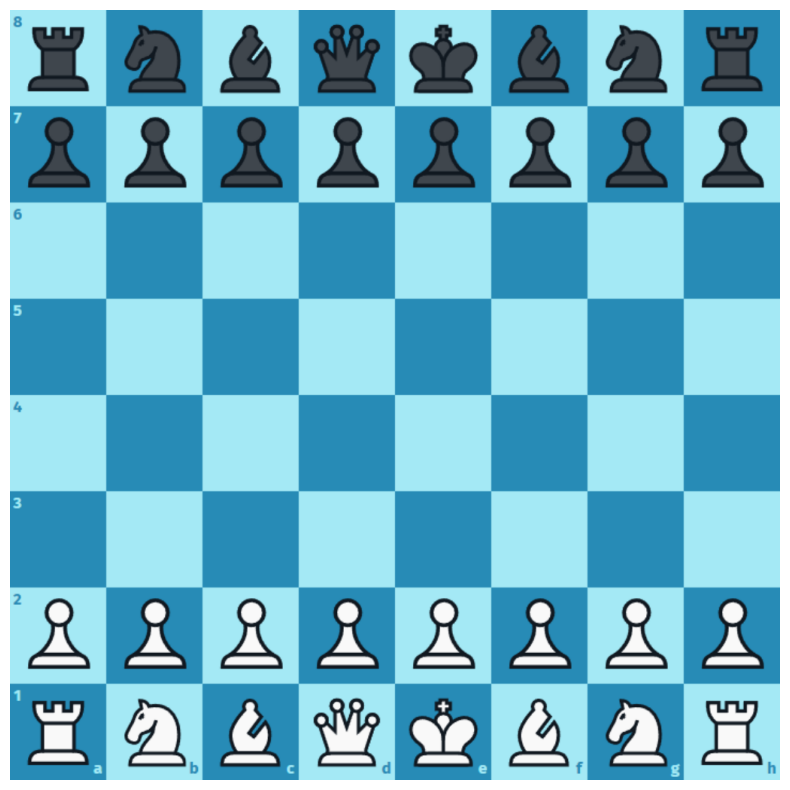

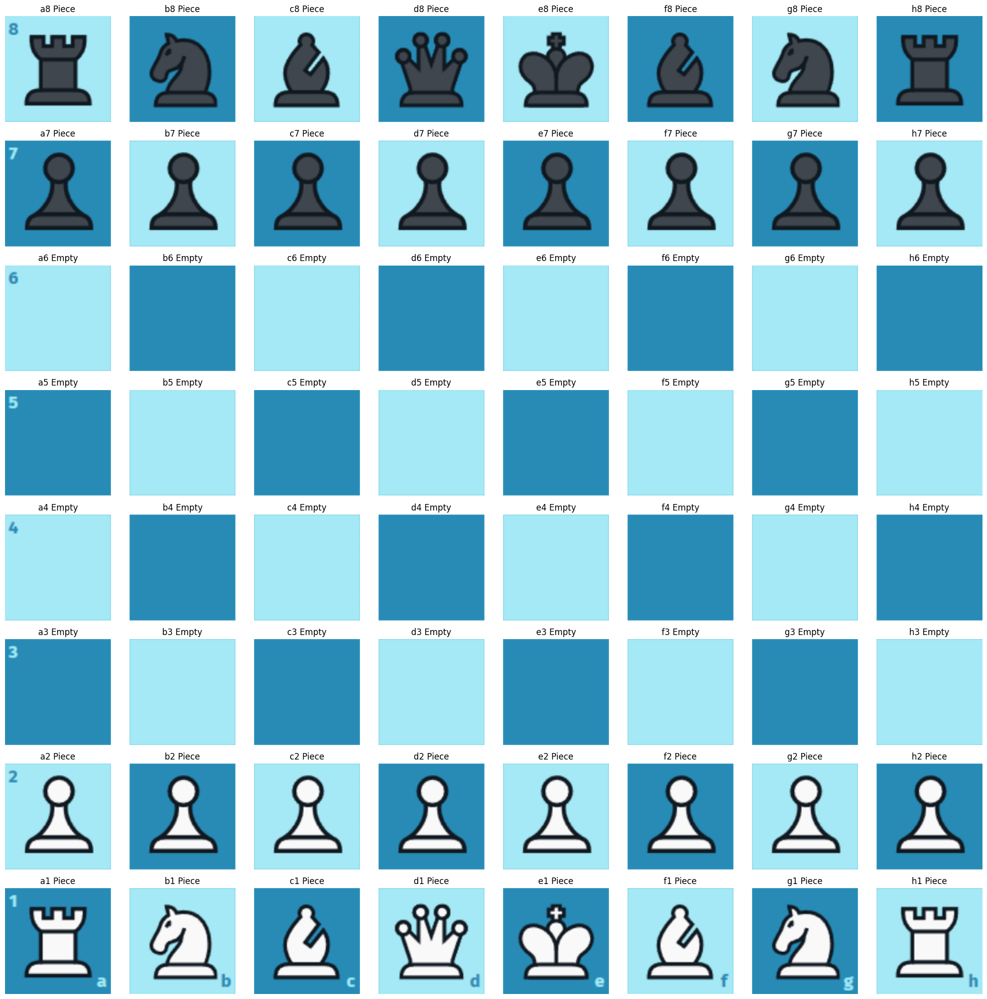

chesscom.png
Time elapsed 0.04338383674621582


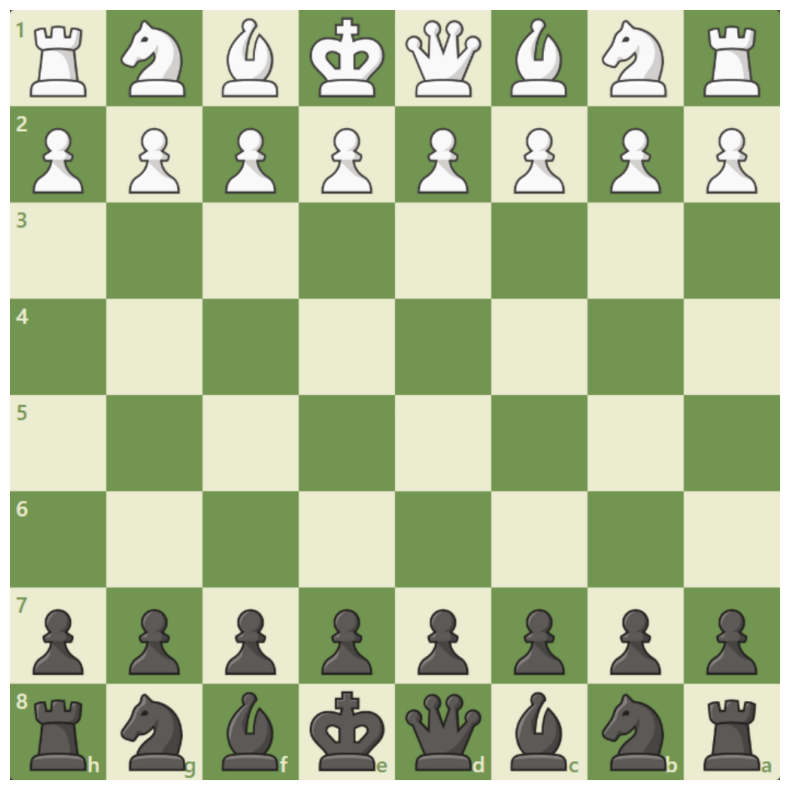

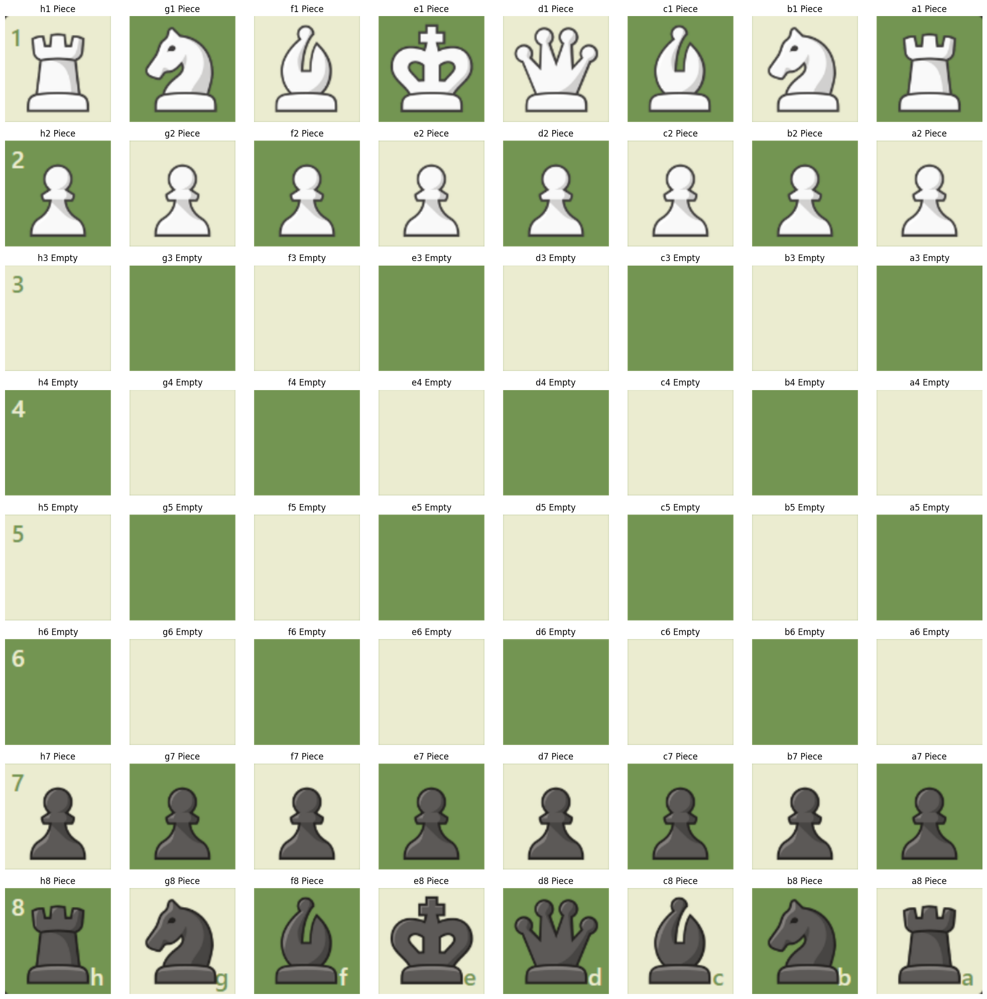

chesscom_discord.png
Time elapsed 0.03499889373779297


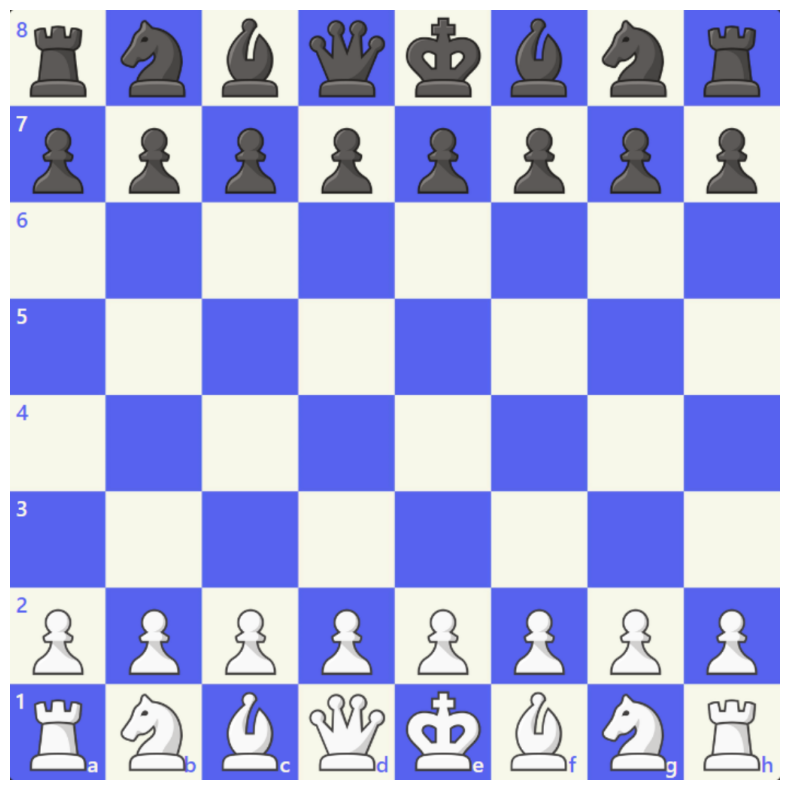

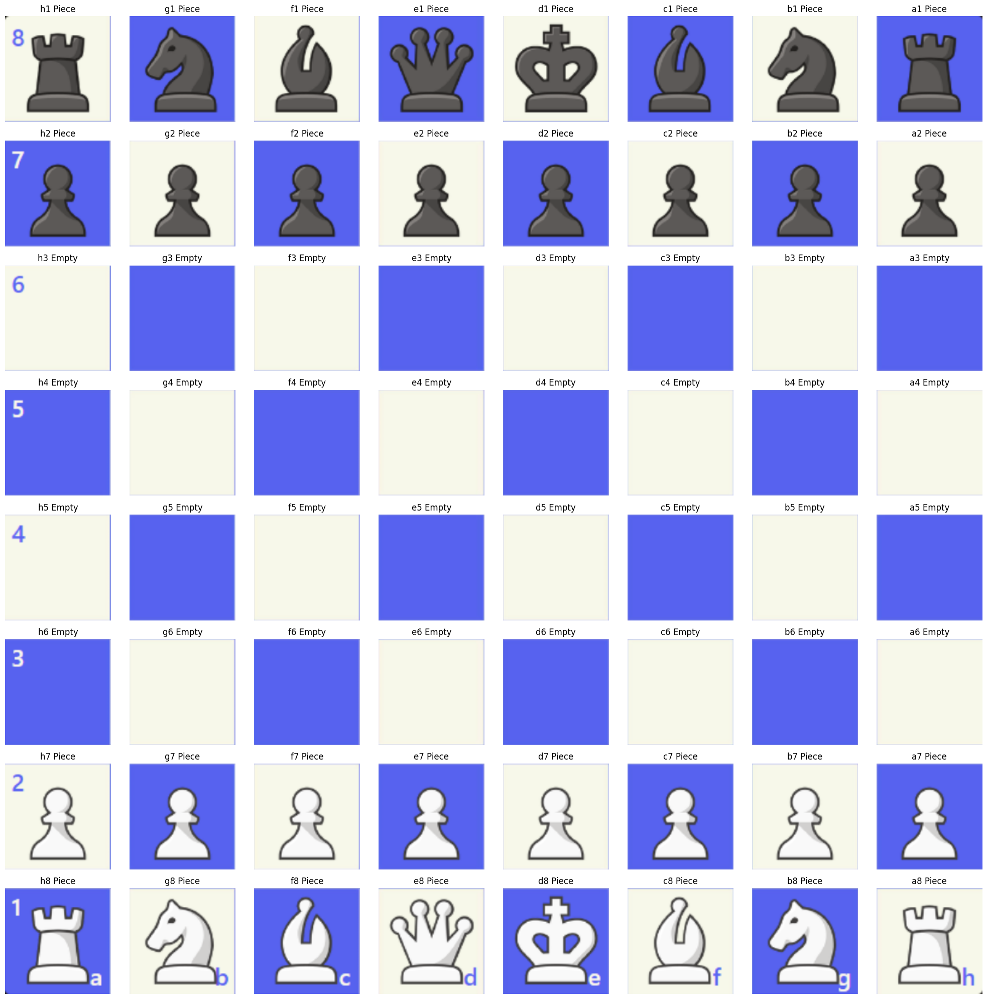

chesscom_halloween.png
Time elapsed 0.047760725021362305


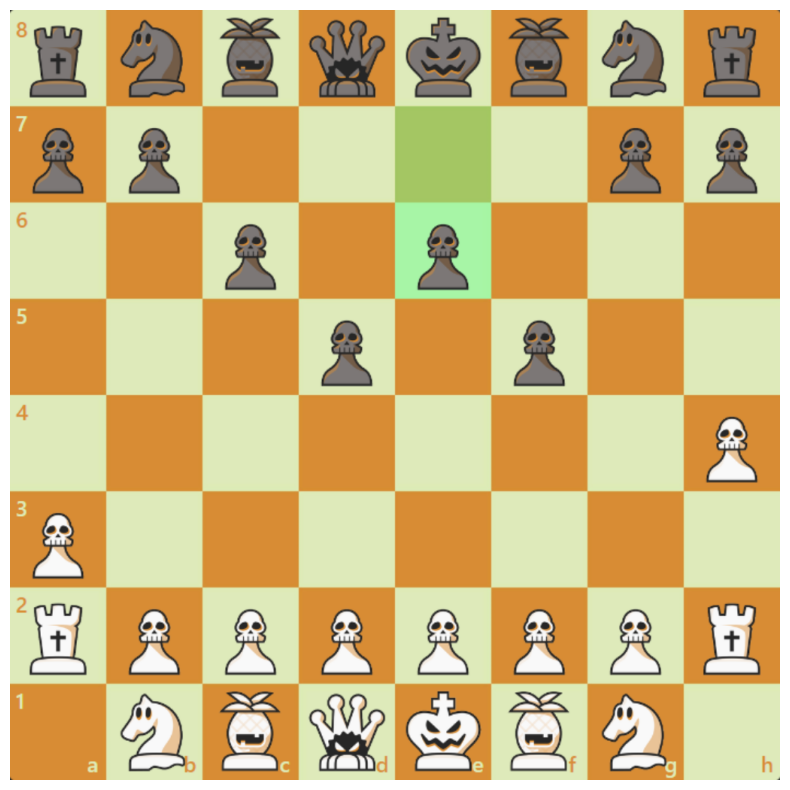

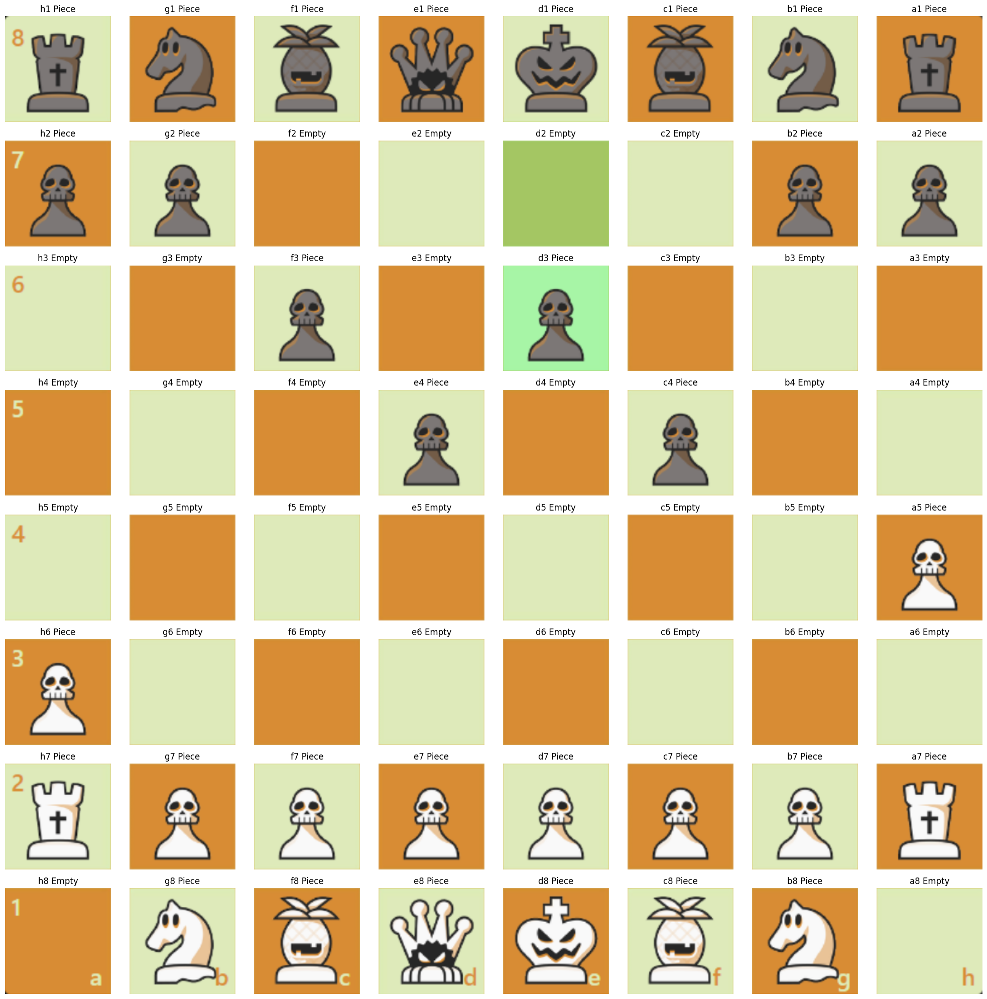

lichess.png
Time elapsed 0.03475213050842285


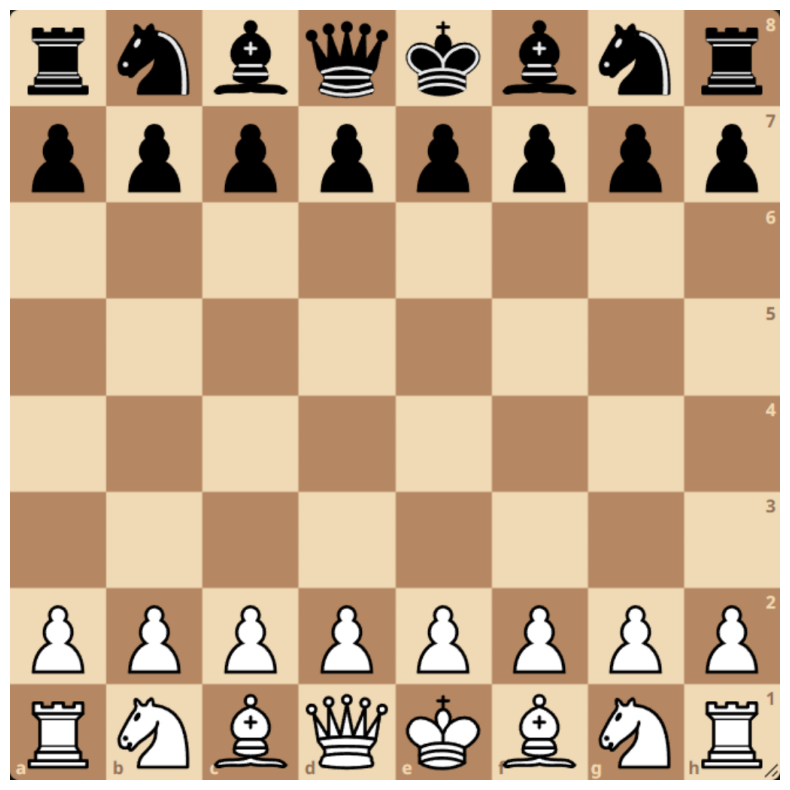

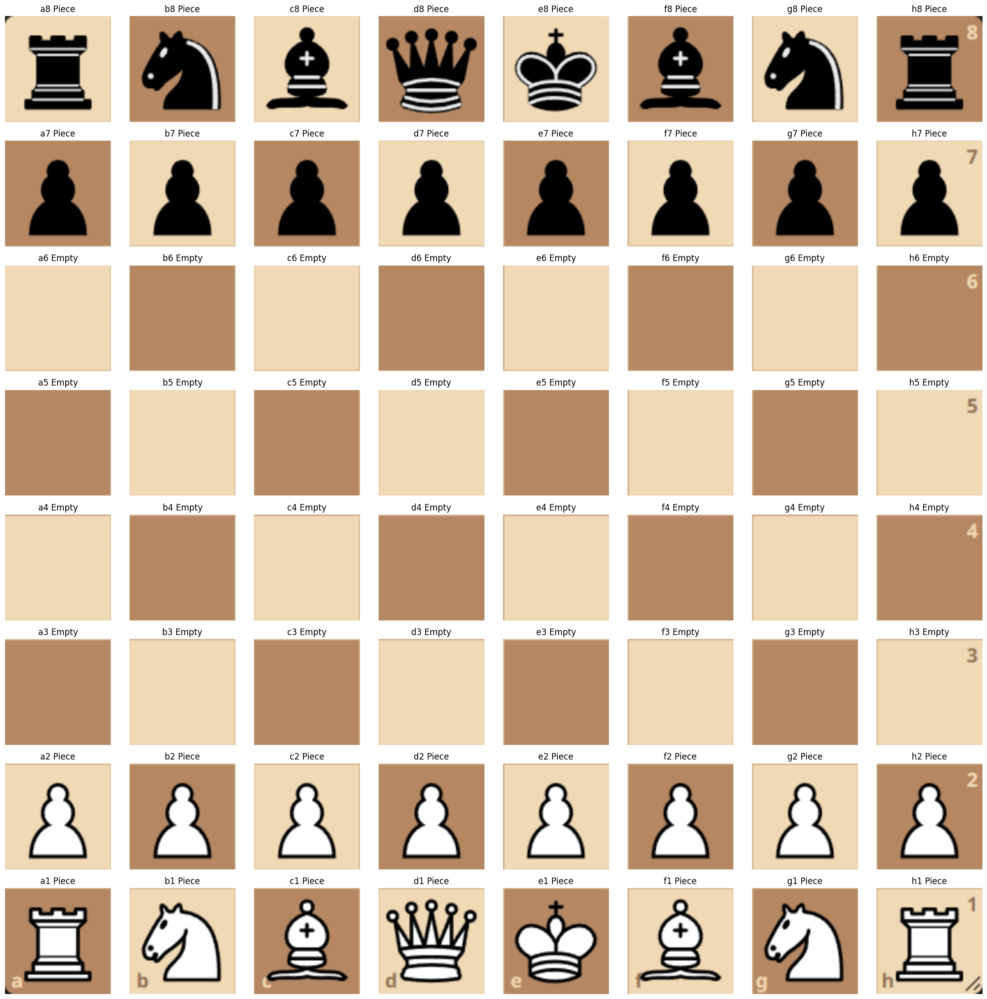

lichess_corners.png
Time elapsed 0.03401041030883789


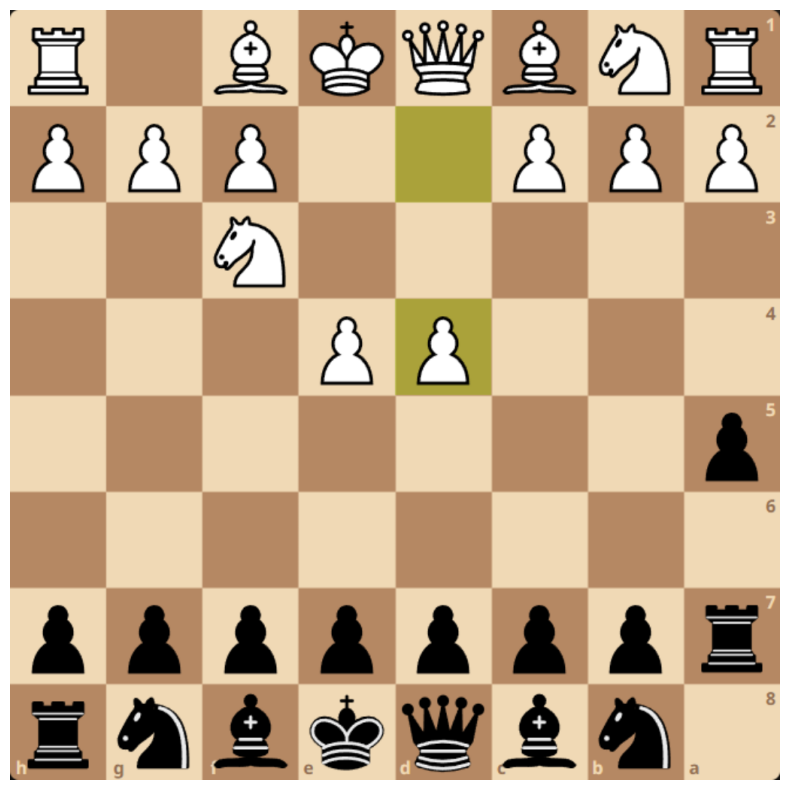

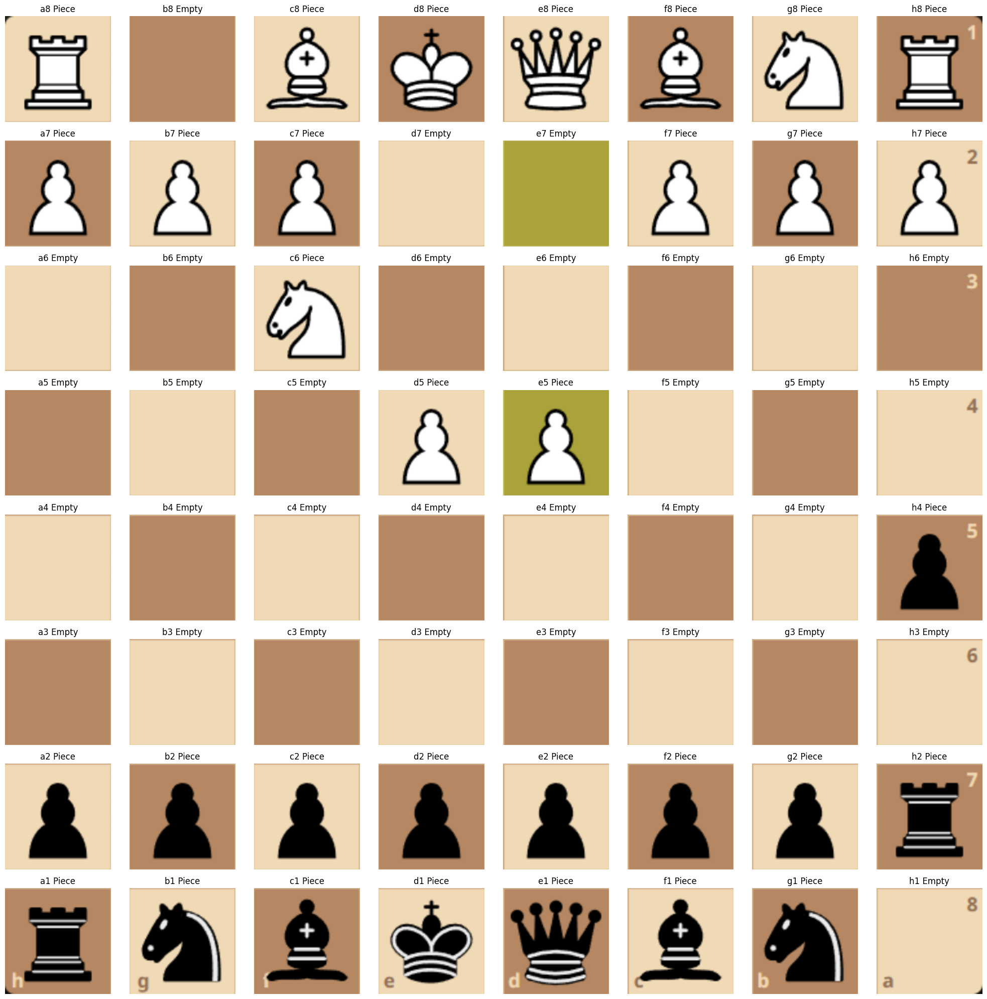

In [37]:
for dir in os.walk("../dataset/sites"):
    for file in dir[2]:
        file_path = os.path.join(dir[0], file)
        print(file)
        player_side = "white"
        if "chesscom" in file_path:
            player_side = "black"
        detect_split(filename=file_path, player_side=player_side)
